In [ ]:
!pip install pycaret

     |████████████████████████████████| 288 kB 14.1 MB/s 
     |████████████████████████████████| 261 kB 76.3 MB/s 
     |████████████████████████████████| 1.7 MB 78.4 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 1.3 MB 44.4 MB/s 
     |████████████████████████████████| 56 kB 2.2 MB/s 
     |████████████████████████████████| 2.0 MB 49.9 MB/s 
     |████████████████████████████████| 113 kB 68.0 MB/s 
     |████████████████████████████████| 86 kB 5.5 MB/s 
     |████████████████████████████████| 15.5 MB 61.8 MB/s 
     |████████████████████████████████| 6.8 MB 71.6 MB/s 
     |████████████████████████████████| 167 kB 75.9 MB/s 
     |████████████████████████████████| 675 kB 60.1 MB/s 
     |████████████████████████████████| 102 kB 11.5 MB/s 
     |████████████████████████████████| 3.1 MB 71.6 MB/s 
     |████████████████

In [ ]:
import pandas as pd
from pycaret.clustering import *

In [ ]:
#Data

In [ ]:
df = pd.read_csv('Supermarket Data.csv')

In [ ]:
df['SHOP_DATE'] = df['SHOP_DATE'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))

In [ ]:
df.head(5)

,SHOP_WEEK,SHOP_DATE,SHOP_WEEKDAY,SHOP_HOUR,QUANTITY,SPEND,PROD_CODE,PROD_CODE_10,PROD_CODE_20,PROD_CODE_30,PROD_CODE_40,CUST_CODE,CUST_PRICE_SENSITIVITY,CUST_LIFESTAGE,BASKET_ID,BASKET_SIZE,BASKET_PRICE_SENSITIVITY,BASKET_TYPE,BASKET_DOMINANT_MISSION,STORE_CODE,STORE_FORMAT,STORE_REGION
0,200732,2007-10-05,6,17,3,6.75,PRD0900001,CL00072,DEP00021,G00007,D00002,CUST0000583261,UM,YF,9.941078e+14,L,MM,Top Up,Grocery,STORE00001,LS,E02
1,200733,2007-10-10,4,20,3,6.75,PRD0900001,CL00072,DEP00021,G00007,D00002,CUST0000537317,MM,OF,9.941079e+14,L,MM,Full Shop,Fresh,STORE00001,LS,E02
2,200741,2007-12-09,1,11,1,2.25,PRD0900001,CL00072,DEP00021,G00007,D00002,CUST0000472158,MM,YF,9.941087e+14,L,MM,Full Shop,Grocery,STORE00001,LS,E02
3,200731,2007-09-29,7,17,1,2.25,PRD0900001,CL00072,DEP00021,G00007,D00002,CUST0000099658,LA,OF,9.941077e+14,L,LA,Full Shop,Mixed,STORE00001,LS,E02
4,200737,2007-11-10,7,14,3,6.75,PRD0900001,CL00072,DEP00021,G00007,D00002,NaN,NaN,NaN,9.941083e+14,L,MM,Full Shop,Fresh,STORE00001,LS,E02


In [ ]:
df.info

<bound method DataFrame.info of         SHOP_WEEK  SHOP_DATE  SHOP_WEEKDAY  SHOP_HOUR  QUANTITY  SPEND  \
0          200732 2007-10-05             6         17         3   6.75   
1          200733 2007-10-10             4         20         3   6.75   
2          200741 2007-12-09             1         11         1   2.25   
3          200731 2007-09-29             7         17         1   2.25   
4          200737 2007-11-10             7         14         3   6.75   
...           ...        ...           ...        ...       ...    ...   
834917     200714 2007-05-29             3         16         1   1.46   
834918     200622 2006-07-27             5         21         1   1.32   
834919     200708 2007-04-17             3         21         1   1.32   
834920     200626 2006-08-27             1         16         1   1.32   
834921     200708 2007-04-16             2         17         1   1.32   

         PROD_CODE PROD_CODE_10 PROD_CODE_20 PROD_CODE_30 PROD_CODE_40  \
0    

#Prepare customer single view


Define features

Total visits = COUNT(DISTINCT BASKET ID)

Ticket size = SUM(SPEND)/COUNT(DISTINCT BASKET ID)

Total no. of SKUs

# Calculate features

In [ ]:
df.columns

Index(['SHOP_WEEK', 'SHOP_DATE', 'SHOP_WEEKDAY', 'SHOP_HOUR', 'QUANTITY',
       'SPEND', 'PROD_CODE', 'PROD_CODE_10', 'PROD_CODE_20', 'PROD_CODE_30',
       'PROD_CODE_40', 'CUST_CODE', 'CUST_PRICE_SENSITIVITY', 'CUST_LIFESTAGE',
       'BASKET_ID', 'BASKET_SIZE', 'BASKET_PRICE_SENSITIVITY', 'BASKET_TYPE',
       'BASKET_DOMINANT_MISSION', 'STORE_CODE', 'STORE_FORMAT',
       'STORE_REGION'],
      dtype='object')

In [ ]:
df['CUST_LIFESTAGE'].replace(to_replace=['OA','OF','OT','PE','YA','YF'], value=[1,2,3,4,5,6], inplace=True)
df['BASKET_TYPE'].replace(to_replace=['Top Up','Full Shop','Small Shop','XX'], value=[1,2,3,0], inplace=True)
df['BASKET_DOMINANT_MISSION'].replace(to_replace=['Grocery','Fresh','Mixed','Nonfood','XX'],value =[1,2,3,4,0],inplace=True)

In [ ]:
##prepare customer single view
df_csv = df_groupby = df[df['CUST_CODE'].notnull()].groupby(by=['CUST_CODE']).agg(TotalSpend=('SPEND', 'sum'),
                                                                                  TotalVisits=('BASKET_ID', 'nunique'),
                                                                                  TotalSKUs=('PROD_CODE', 'nunique'),
                                                                                  FirstDate=('SHOP_DATE', 'min'),
                                                                                  LastDate=('SHOP_DATE', 'max'),
                                                                                  SHOP_HOUR=('SHOP_HOUR','mean'),
                                                                                  LifeStage=('CUST_LIFESTAGE','min'),
                                                                                  BasketType=('BASKET_TYPE','max'),
                                                                                  BasketMission=('BASKET_DOMINANT_MISSION','max')
                                                                                  ).reset_index()

In [ ]:
df_csv

,CUST_CODE,TotalSpend,TotalVisits,TotalSKUs,FirstDate,LastDate,SHOP_HOUR,LifeStage,BasketType,BasketMission
0,CUST0000000181,2.44,1,1,2007-01-06,2007-01-06,13.000000,NaN,3.0,2.0
1,CUST0000000369,692.32,209,119,2006-04-16,2008-07-05,15.478495,1.0,3.0,4.0
2,CUST0000000689,328.57,16,116,2007-07-22,2008-06-23,15.367568,NaN,3.0,4.0
3,CUST0000000998,5.95,3,4,2006-05-04,2006-07-07,11.500000,NaN,3.0,4.0
4,CUST0000001163,39.74,4,24,2006-10-22,2008-06-22,15.400000,NaN,3.0,3.0
...,...,...,...,...,...,...,...,...,...,...
5839,CUST0000999593,453.58,30,206,2006-05-06,2008-04-02,14.831650,6.0,3.0,4.0
5840,CUST0000999645,75.01,10,30,2006-04-30,2008-05-08,18.365854,3.0,3.0,4.0
5841,CUST0000999654,1.35,1,2,2006-06-25,2006-06-25,14.000000,NaN,1.0,2.0
5842,CUST0000999935,444.17,21,127,2006-11-29,2008-06-05,14.699153,6.0,3.0,4.0


In [ ]:
##calculate ticket size
df_csv['TicketSize'] = df_csv['TotalSpend']/df_csv['TotalVisits']

In [ ]:
##find max date in the dataset
max_date = df_csv['LastDate'].max()

In [ ]:
##calculate total days of the relationship
df_csv['total_days'] = (df_csv['LastDate'] - df_csv['FirstDate']).dt.days + 1

In [ ]:
##calculate recency days
df_csv['recency'] = (max_date - df_csv['LastDate']).dt.days

In [ ]:
df_csv

,CUST_CODE,TotalSpend,TotalVisits,TotalSKUs,FirstDate,LastDate,SHOP_HOUR,LifeStage,BasketType,BasketMission,TicketSize,total_days,recency
0,CUST0000000181,2.44,1,1,2007-01-06,2007-01-06,13.000000,NaN,3.0,2.0,2.440000,1,547
1,CUST0000000369,692.32,209,119,2006-04-16,2008-07-05,15.478495,1.0,3.0,4.0,3.312536,812,1
2,CUST0000000689,328.57,16,116,2007-07-22,2008-06-23,15.367568,NaN,3.0,4.0,20.535625,338,13
3,CUST0000000998,5.95,3,4,2006-05-04,2006-07-07,11.500000,NaN,3.0,4.0,1.983333,65,730
4,CUST0000001163,39.74,4,24,2006-10-22,2008-06-22,15.400000,NaN,3.0,3.0,9.935000,610,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5839,CUST0000999593,453.58,30,206,2006-05-06,2008-04-02,14.831650,6.0,3.0,4.0,15.119333,698,95
5840,CUST0000999645,75.01,10,30,2006-04-30,2008-05-08,18.365854,3.0,3.0,4.0,7.501000,740,59
5841,CUST0000999654,1.35,1,2,2006-06-25,2006-06-25,14.000000,NaN,1.0,2.0,1.350000,1,742
5842,CUST0000999935,444.17,21,127,2006-11-29,2008-06-05,14.699153,6.0,3.0,4.0,21.150952,555,31


# **Cluster customers**

In [ ]:
exp_clu = setup(data=df_csv, ignore_features=['CUST_CODE','FirstDate', 'LastDate'], normalize=True)

,Description,Value
0,session_id,5691
1,Original Data,"(5844, 13)"
2,Missing Values,True
3,Numeric Features,9
4,Categorical Features,1
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(5844, 15)"
9,CPU Jobs,-1


In [ ]:
models()

,Name,Reference
ID,,
kmeans,K-Means Clustering,sklearn.cluster._kmeans.KMeans
ap,Affinity Propagation,sklearn.cluster._affinity_propagation.Affinity...
meanshift,Mean Shift Clustering,sklearn.cluster._mean_shift.MeanShift
sc,Spectral Clustering,sklearn.cluster._spectral.SpectralClustering
hclust,Agglomerative Clustering,sklearn.cluster._agglomerative.AgglomerativeCl...
dbscan,Density-Based Spatial Clustering,sklearn.cluster._dbscan.DBSCAN
optics,OPTICS Clustering,sklearn.cluster._optics.OPTICS
birch,Birch Clustering,sklearn.cluster._birch.Birch
kmodes,K-Modes Clustering,kmodes.kmodes.KModes


In [ ]:
get_metrics()

,Name,Display Name,Score Function,Scorer,Target,Args,Greater is Better,Needs Ground Truth,Custom
ID,,,,,,,,,
silhouette,Silhouette,Silhouette,<function silhouette_score at 0x7f70ec76aef0>,make_scorer(silhouette_score),pred,{},True,False,False
chs,Calinski-Harabasz,Calinski-Harabasz,<function calinski_harabasz_score at 0x7f70ec7...,make_scorer(calinski_harabasz_score),pred,{},True,False,False
db,Davies-Bouldin,Davies-Bouldin,<function davies_bouldin_score at 0x7f70ec770290>,make_scorer(davies_bouldin_score),pred,{},True,False,False
hs,Homogeneity Score,Homogeneity,<function homogeneity_score at 0x7f70ec74cf80>,make_scorer(homogeneity_score),pred,{},True,True,False
ari,Rand Index,Rand Index,<function adjusted_rand_score at 0x7f70ec74cd40>,make_scorer(adjusted_rand_score),pred,{},True,True,False
cs,Completeness Score,Completeness,<function completeness_score at 0x7f70ec752050>,make_scorer(completeness_score),pred,{},True,True,False


In [ ]:
metrics = []
for model in models().index:
    if model in ['meanshift', 'optics']:
        continue
    create_model(model)
    metric_result = pull()
    metric_result['model'] = model
    metrics.append(metric_result)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0418,124.8109,4.648,0,0,0


In [ ]:
cluster_metrics = pd.concat(metrics)
cluster_metrics.set_index("model", inplace=True)
cluster_metrics.sort_values(by='Silhouette', ascending=False, inplace=True)
cluster_metrics.style.highlight_max(subset=['Silhouette', 'Calinski-Harabasz'], color = 'green', axis = 0).highlight_min(subset=['Davies-Bouldin'], color = 'green', axis = 0)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
model,,,,,,
sc,0.670600,107.712700,0.372700,0,0,0
kmeans,0.254500,1858.097700,1.305700,0,0,0
birch,0.211100,1619.724300,1.420200,0,0,0
hclust,0.193400,1537.087100,1.459700,0,0,0
ap,0.186600,221.275900,1.350100,0,0,0
kmodes,0.041800,124.810900,4.648000,0,0,0
dbscan,-0.334000,19.338400,1.470400,0,0,0


# Spectral Clustering Clustering

In [ ]:
sc = create_model('sc')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6706,107.7127,0.3727,0,0,0


In [ ]:
plot_model(sc)

# KMeans Clustering

In [ ]:
kmeans = create_model('kmeans')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2545,1858.0977,1.3057,0,0,0


In [ ]:
print(kmeans)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=5691, tol=0.0001, verbose=0)


In [ ]:
plot_model(kmeans)

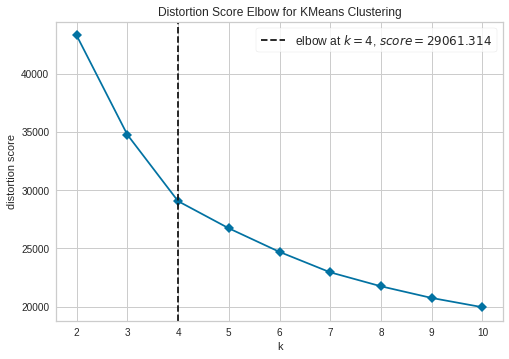

In [ ]:
plot_model(kmeans, plot = 'elbow')

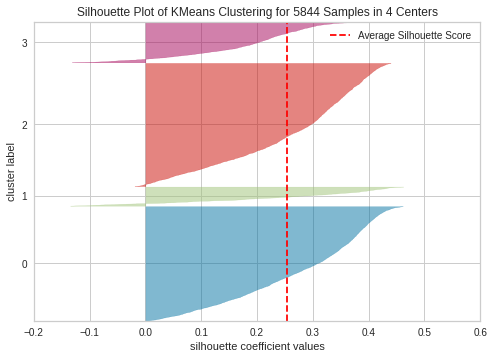

In [ ]:
plot_model(kmeans, plot = 'silhouette')

## https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html

# **Interpret results and plan for actions**

In [ ]:
kmeans_results = assign_model(kmeans)

In [ ]:
kmeans_results.head(5)

,CUST_CODE,TotalSpend,TotalVisits,TotalSKUs,FirstDate,LastDate,SHOP_HOUR,LifeStage,BasketType,BasketMission,TicketSize,total_days,recency,Cluster
0,CUST0000000181,2.44,1,1,2007-01-06,2007-01-06,13.000000,NaN,3.0,2.0,2.440000,1,547,Cluster 2
1,CUST0000000369,692.32,209,119,2006-04-16,2008-07-05,15.478495,1.0,3.0,4.0,3.312536,812,1,Cluster 1
2,CUST0000000689,328.57,16,116,2007-07-22,2008-06-23,15.367568,NaN,3.0,4.0,20.535625,338,13,Cluster 0
3,CUST0000000998,5.95,3,4,2006-05-04,2006-07-07,11.500000,NaN,3.0,4.0,1.983333,65,730,Cluster 2
4,CUST0000001163,39.74,4,24,2006-10-22,2008-06-22,15.400000,NaN,3.0,3.0,9.935000,610,14,Cluster 0


In [ ]:
plot_model(kmeans)

In [ ]:
plot_model(kmeans, plot = 'distribution')

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'BasketType')

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'BasketMission')

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'TotalSpend')

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'TicketSize')

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'recency')

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'LifeStage')

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'TotalVisits')

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'TotalSKUs')